<a href="https://colab.research.google.com/github/nazaribih/ML_intro/blob/main/Diabetes_Detection_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Machine learning - Diabetes detection - EDA**

### Nazarii Bihniak, Katarzyna Rogalska

## Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##ToDo


1) podzielić dane na train, validacja, test (test zapisać dla innej grupy) **DONE**

2) Wymyślić jeden cel biznesowy **DONE**

2) wywołać wykresy i cała analiza na zbiorze train (walidacyjny dopiero na etapie modelu)

3) sprawdzić obie korelacje : Pearson, Spearman **DONE**

4) wysłać do walidacji

5) zrobić walidację dla grupy 1

**Pytanka:**
*  Co zrobić z class imbalance ???


## Imports and data loading

In [ ]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# df read from Colab/github
#df = pd.read_csv("/content/diabetes_012_health_indicators_BRFSS2015.csv")

# df read from Google Drive if mounted
df = pd.read_csv("/content/drive/MyDrive/ml_diabetes/diabetes_012_health_indicators_BRFSS2015.csv")
#df = pd.read_csv("/content/drive/MyDrive/CSV_ML/diabetes_012_health_indicators_BRFSS2015.csv")

## Train Validation Test Split

In [ ]:
from sklearn.model_selection import train_test_split
y = np.array(df['Diabetes_012'])
X = df.drop(['Diabetes_012'], axis=1)

X_train, X_val, Y_train, Y_val = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)

X_val, X_test, Y_val, Y_test = train_test_split(X_val, Y_val, stratify=Y_val, test_size=0.3, random_state=42)


test_df = X_test
test_df['Diabetes_012']=Y_test

test_df.to_csv("Test_DataFrame_Diabetes.csv", index=False)

val_df = X_val
val_df['Diabetes_012']= Y_val

val_df.to_csv('Validation_DataFrame_Diabetes.csv', index=False)

train_df = X_train
train_df['Diabetes_012']=Y_train

train_df.to_csv("Training_DataFrame_Diabetes.csv", index=False)

## Data Understanding

**Main info**

Data from:  [Data frames with columns explanations](https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset/data?select=diabetes_012_health_indicators_BRFSS2015.csv)


**Where is the data from?**

Data frame includes data collected in 2015 from The Behavioral Risk Factor Surveillance System (BRFSS) which is a health-related telephone survey that is collected annually by the CDC.


**Main goal : predict the risk of diabetes**


Data frame Kaggle desc:
 **diabetes _ 012 _ health _ indicators _ BRFSS2015.csv** is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_012 has 3 classes. 0 is for no diabetes or only during pregnancy, 1 is for prediabetes, and 2 is for diabetes. There is class imbalance in this dataset. This dataset has 21 feature variables.

In [ ]:
# OD TEGO MOMENTU PRACUJEMY NA TRAIN_DF
train_df.reset_index(drop=True, inplace=True)
train_df.describe()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_012
count,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,...,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000,177576.000000
mean,0.429630,0.423886,0.962472,28.382923,0.444762,0.040580,0.093965,0.755992,0.634190,0.811236,...,0.084003,2.509399,3.190262,4.236124,0.169026,0.439457,8.035005,5.049652,6.052806,0.296921
std,0.495025,0.494174,0.190051,6.606454,0.496941,0.197315,0.291781,0.429499,0.481658,0.391322,...,0.277394,1.068232,7.419593,8.711941,0.374776,0.496322,3.057219,0.986244,2.071532,0.698159
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000,0.000000
50%,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000,0.000000
75%,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000,0.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000,2.000000


In [ ]:
train_df.head(10)

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_012
0,1.0,1.0,1.0,37.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,3.0,15.0,0.0,1.0,0.0,8.0,6.0,1.0,0.0
1,1.0,1.0,1.0,27.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,3.0,0.0,0.0,0.0,0.0,10.0,6.0,8.0,0.0
2,0.0,0.0,1.0,21.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,5.0,5.0,8.0,0.0
3,1.0,1.0,1.0,27.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,3.0,0.0,3.0,0.0,1.0,11.0,5.0,8.0,0.0
4,0.0,0.0,1.0,31.0,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,2.0,0.0,0.0,0.0,1.0,2.0,5.0,6.0,0.0
5,1.0,1.0,1.0,44.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,5.0,30.0,30.0,1.0,1.0,10.0,4.0,7.0,2.0
6,0.0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,1.0,4.0,6.0,7.0,0.0
7,0.0,0.0,1.0,31.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,2.0,0.0,5.0,0.0,0.0,10.0,6.0,8.0,0.0
8,1.0,1.0,1.0,27.0,0.0,0.0,1.0,0.0,1.0,1.0,...,0.0,4.0,30.0,30.0,0.0,0.0,11.0,6.0,8.0,0.0
9,1.0,1.0,1.0,27.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0.0,1.0,3.0,3.0,1.0,0.0,12.0,2.0,1.0,2.0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 177576 entries, 0 to 177575
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   HighBP                177576 non-null  float64
 1   HighChol              177576 non-null  float64
 2   CholCheck             177576 non-null  float64
 3   BMI                   177576 non-null  float64
 4   Smoker                177576 non-null  float64
 5   Stroke                177576 non-null  float64
 6   HeartDiseaseorAttack  177576 non-null  float64
 7   PhysActivity          177576 non-null  float64
 8   Fruits                177576 non-null  float64
 9   Veggies               177576 non-null  float64
 10  HvyAlcoholConsump     177576 non-null  float64
 11  AnyHealthcare         177576 non-null  float64
 12  NoDocbcCost           177576 non-null  float64
 13  GenHlth               177576 non-null  float64
 14  MentHlth              177576 non-null  float64
 15  

Observations:

* There are no missing values

* All columns are numeric

In [ ]:
train_df.nunique()

HighBP                   2
HighChol                 2
CholCheck                2
BMI                     83
Smoker                   2
Stroke                   2
HeartDiseaseorAttack     2
PhysActivity             2
Fruits                   2
Veggies                  2
HvyAlcoholConsump        2
AnyHealthcare            2
NoDocbcCost              2
GenHlth                  5
MentHlth                31
PhysHlth                31
DiffWalk                 2
Sex                      2
Age                     13
Education                6
Income                   8
Diabetes_012             3
dtype: int64

Observations:

* Although data is numeric there are many "categorical" 0-1 columns

## Columns descrption and businnes aim

**columns desc**

* Diabetes_012 : 0-no diabetes, 1- prediabetes, 2-diabates

* HighBP : 1-high blood pressure, 0- no

* HighChol: 1-high cholesterol, 0- no

* CholCheck : 1- cholesterol check in 5 years, 0- no

* BMI : Body Mass index

* Smoker : 1-have you smoked at leat 100 cigarettes in your life, 0-no

* Stroke : 1-has a stroke, 0-no

* HeartDisease : 1- coronary heart disease or myocardical infection, 0-no

* PhysActivity: 1- physical activity in past 30 days, 0-no

* Fruits : 1- consume fruits 1 or more times a day, 0-no

* Veggies: 1-consume vegetables 1 or more times a day, 0-no

* HvyAlcoholConsumption: 1- Adult woman having more than 7 drinks a week, men 14 drinks per week, 0-no

* AnyHealthcare : 1- any kind of healthcare inculding isurance etc, 0-no

* NoDocbcCost : 1- was there a time in the past year when you needed to see a doctor but could aford it, 0-no

* GenHealth: What do you sey your general health is on a scale 1-5, 1=excellent and 5=poor

* MentHlth: Now thinking about your mental health, which includes stress, depression, and problems with emotions, for how many days during the past 30 days was your mental health not good?
scale 1-30 days ---> Scale 1-30

* PhysHlth: Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30 days was your physical health not good?
scale 1-30 days ---> Scale 1-30

* DiffWalk : 1-you have serious difficulty walking or climbing stairs, 0-no

* Sex : 0-female, 1-male

* Age: 13-level category (_AGEG5YR) 1=18-24, 13 = 80 and older

* Education: education level 1-6 where 1=never attened school, 2=grades 1-8 ...

* Income: income scale 1-8, where 1<10,000$, 8>75,000$

**Business aim**

*Creating a programm (app) for medical workers (mostly doctors) to predict their patients diabetes-risks in order to prevent illness or initiate early tretment.*

*This can save bilions of dollars on diabetes treatments and reduce the amount of deaths from high stages of untreated diabetes*

## All features correlation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

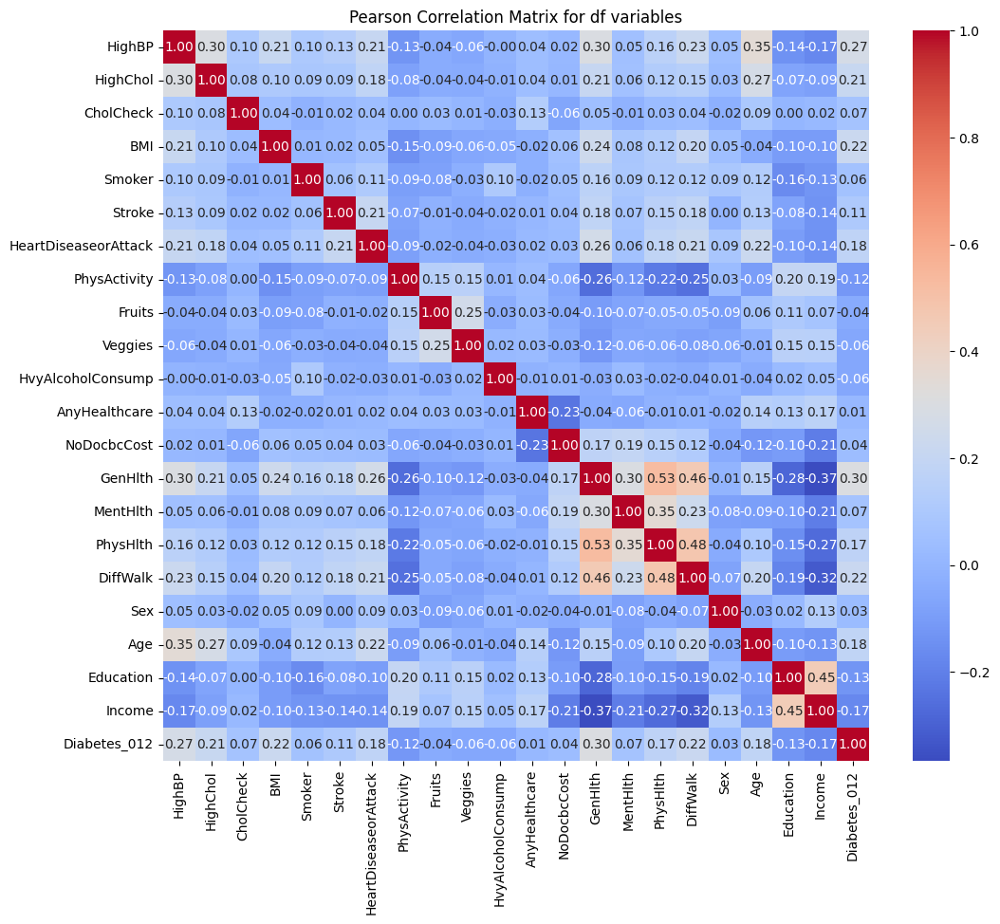

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(train_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Pearson Correlation Matrix for df variables")
plt.show()

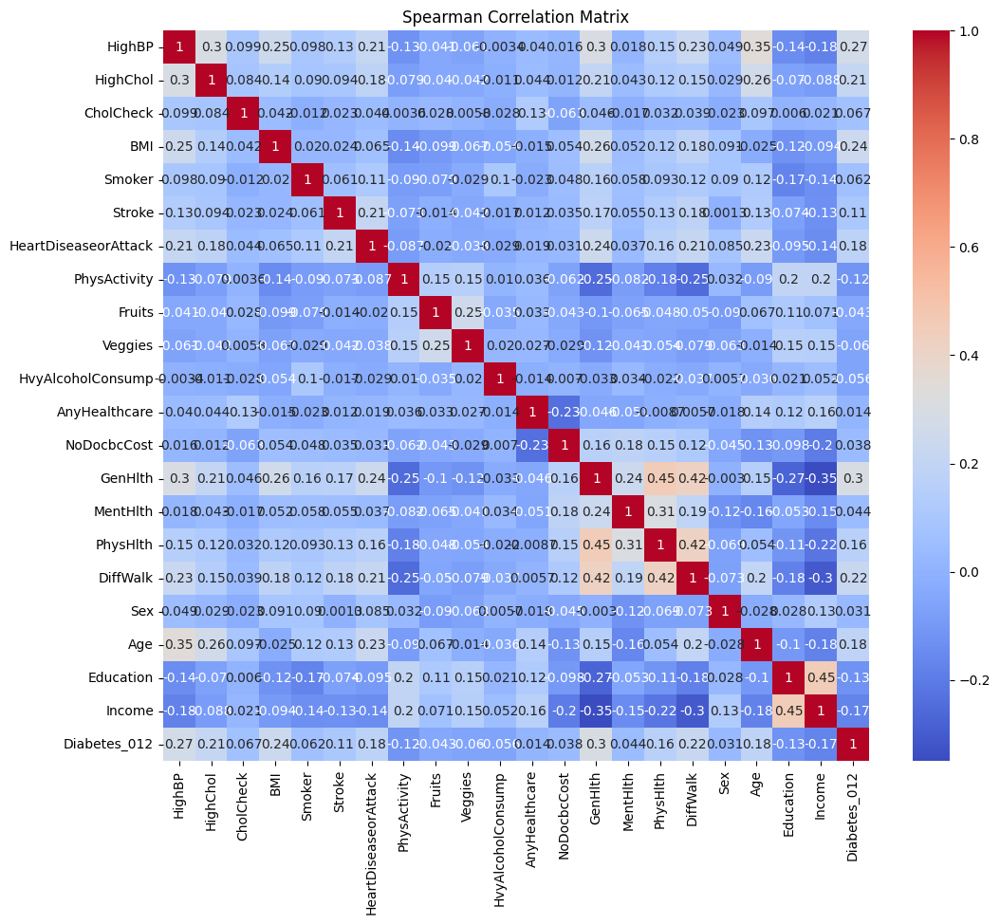

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(train_df.corr(method='spearman'), annot=True, cmap='coolwarm')
plt.title("Spearman Correlation Matrix")
plt.show()

The biggest correlations are of Diabetes_binary are with HighBP, HighChol, BMI, HeartDiseaseorAttack, GenHlth, PhysHlth, DiffWalk, and Age

There are no features with high correlation so redundancy is not a problem (looking only on correlation)

Spearman correlation shows similar results


## Diabetes (target) characteristics

In [ ]:
px.histogram(df, x="Diabetes_012")
x=df.shape[0]
print(x)

print("Percent of people without diabetes:" ,(df["Diabetes_012"]==0).sum()/x)
print("Percent of people with prediabetes:" ,(df["Diabetes_012"]==1).sum()/x)
print("Percent of people with diabetes:" ,(df["Diabetes_012"]==2).sum()/x)

222267
Percent of people without diabetes: 0.8424462470812132
Percent of people with prediabetes: 0.01831580936441307
Percent of people with diabetes: 0.1392379435543738


Observations:
* there is class imbalance - we have way more healthy observations
* How to deal with class imbalance??

## BMI distribution vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x='BMI',
                   marginal='box',
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['green',"yellow",'orange'],
                   title="BMI distribution"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print("BMI vs diabetes corr: " , train_df.Diabetes_012.corr(train_df.BMI))

BMI vs diabetes corr:  0.22481360571936332


Observations:
* There are many outliers (people with high BMI) who are either ill or not (there are many people with high BMi but without diabetes)
* The median of BMI is the highest for people with prediabetes and the lowest for people without diabetes
* BMI distribution is close to Gauss
* There is a correlation between diabetes and BMI

##Blood Pressure distribution vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['HighBP'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Blood Pressure distribution vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print("Correlation between BP and diabetes:", train_df.Diabetes_012.corr(train_df.HighBP))

Correlation between BP and diabetes: 0.2724957860924661


Observations:
* There are less people with high BP than without
* There are more ill people among people with highBP
* There is a correlation between blood pressure and diabetes

## Cholesterol distribution vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['HighChol'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Cholesterol distribution vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print("Correlation between Cholesterol and diabetes:", train_df.Diabetes_012.corr(train_df.HighChol))


Correlation between Cholesterol and diabetes: 0.20937043374816336


Observation:
* relationship is very similar to the Blood pressure
* there is a correlation between HighBP and HighChol (0.29) but not big enough to drop this column
* There is a feature CholCheck which is irrelevant for us when we see the results. We may drop this column

## Smoking vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['Smoker'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Smoking vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print("Correlation between smoking and diabetes", train_df.Smoker.corr(train_df.Diabetes_012))

Correlation between smoking and diabetes 0.0644309946767766


Observations:
* there are more non-smokers in this dataset
* the number of ill (pre and diabetes) is similar in both groups
* the correlation is low
* maybe this feature isn't relevant to the predictions? But the articles online suggest otherwise


## Stroke vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['Stroke'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Stroke vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print("Correlation between Stroke and diabetes:", train_df.Diabetes_012.corr(train_df.Stroke))

Correlation between Stroke and diabetes: 0.106261210773987


Observations:
* class imbalance - way more data from people withou strokes
* Correlation is pretty high

## HeartDisease vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['HeartDiseaseorAttack'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Heart disease vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print(train_df.HeartDiseaseorAttack.corr(train_df.Diabetes_012))

0.18006375070334846


Observations:
* Situation is very similar to Stroke - also class imbalance and similar corr

## Physical activity vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['PhysActivity'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Physical activity vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print(train_df.PhysActivity.corr(train_df.Diabetes_012))

-0.12162907334207813


Observations:

* There is also class imbalance here
* circa 24% of people with poor activity have pre or diabetes
* circa 12% of people with good activity have pre or diabetes
* We have -0.12 correlation - there are less ill people when the physical activity is higher (=1)

## Fruits and veggies vs diabetes

In [ ]:
fig = px.histogram(train_df,
                   x=train_df['Fruits'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Fruits vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print(train_df.Fruits.corr(train_df.Diabetes_012))


-0.04224025322366643


Observations:
* The correlation is small
* the percentage of ill people is similar in both groups

In [ ]:
fig = px.histogram(train_df,
                   x='Veggies',
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['green','yellow','orange'],
                   title="Veggies vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print(train_df.Veggies.corr(train_df.Diabetes_012))

Observations:
* bigger class imbalance than fruits
* also small correlation

## Alcohol vs diabetes


In [ ]:
fig = px.histogram(train_df,
                   x=train_df['HvyAlcoholConsump'].astype(str),
                   nbins=47,
                   color='Diabetes_012',
                   color_discrete_sequence=['#a8df92','#e7cd13','#f19805'],
                   title="Alcohol vs diabetes"
                   )
fig.update_layout(bargap=0.1)
fig.show()
print(train_df.HvyAlcoholConsump.corr(train_df.Diabetes_012))

-0.05685368487696918


Observations:
* even bigger class imbalance
* circa 16% who are not heavy drinkers have pre or diabetes
* hard to tell for the other group

## Number of People by GenHlth (their health estimation) with and without Diabetes

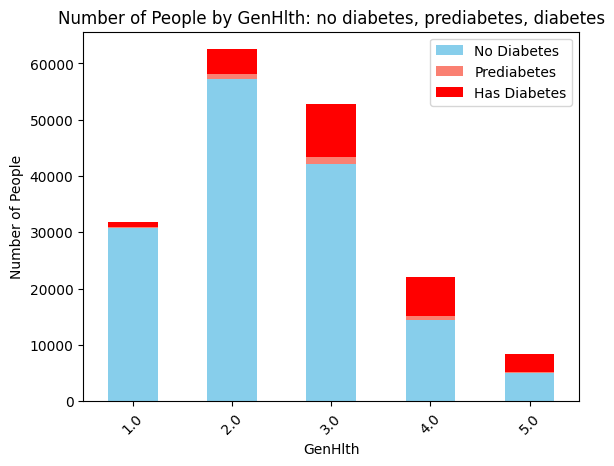

In [ ]:
# To analyze GenHlth, PhysHlth, DiffWalk, and Age vs. Diabetes_binary

# GenHlth: 1 - 5:
# 1 - excelent, 5 - poor

count_df = train_df.groupby(['GenHlth', 'Diabetes_012']).size().unstack(fill_value=0)

# Plotting
count_df.plot(kind='bar', stacked=True, color=['skyblue', 'salmon','red'])
plt.title('Number of People by GenHlth: no diabetes, prediabetes, diabetes')
plt.xlabel('GenHlth')
plt.ylabel('Number of People')
plt.xticks(rotation=45)
plt.legend(['No Diabetes', 'Prediabetes' ,'Has Diabetes'])

plt.show()

Observations:
* The poorer GenHlth is, the bigger percentage of people has diabetes in this category
* correlation is high


## Violin plot for people who have and don't have diabetes

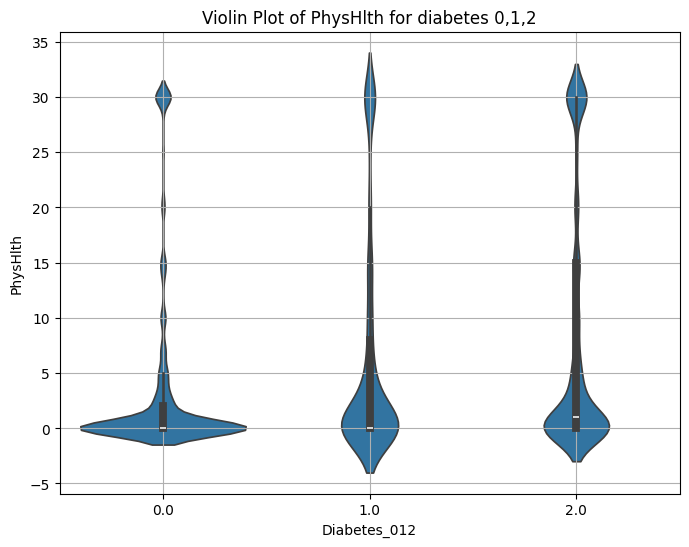

In [ ]:
# Now thinking about your physical health,
# which includes physical illness
# and injury, for how many days during
# the past 30 days was your physical health not good?
# scale 1-30 days

# Violin plot for people who have and don't have diabetes to check if they were feeling bad during the the last 30 days
plt.figure(figsize=(8, 6))
sns.violinplot(x='Diabetes_012', y='PhysHlth', data=train_df)
plt.title('Violin Plot of PhysHlth for diabetes 0,1,2')
plt.xlabel('Diabetes_012')
plt.ylabel('PhysHlth')
plt.grid(True)

Observations:
* people who have diabetes or prediabetes usually feel worse more days that those without
* correlations exist, but they are not so strong
* people who don't have diabetes usually feel bad very rarely - the biggest part of the distribution is in the interval of less then 3 days
* the previous observation is much "weaker" for people with diabetes, but it also exists
* there are little condensations on the top of each plots, probably because peaople may feel bad due to some other factors (diseases)

## People by Difficulty in Walking (with and without diabetes)

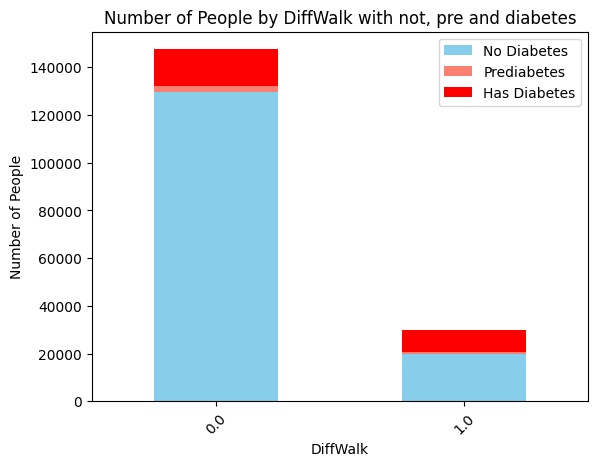

Diabetes_012,0.0,1.0,2.0,Prediabetes_or_Diabetes_%
DiffWalk,,,,
0.0,129660,2352,15549,12.131254
1.0,19932,890,9193,33.593203


In [ ]:
# DiffWalk (0,1) - (Yes,No)

count_df = train_df.groupby(['DiffWalk', 'Diabetes_012']).size().unstack(fill_value=0)

# Plotting
count_df.plot(kind='bar', stacked=True, color=['skyblue', 'salmon','red'])
plt.title('Number of People by DiffWalk with not, pre and diabetes')
plt.xlabel('DiffWalk')
plt.ylabel('Number of People')
plt.xticks(rotation=45)
plt.legend(['No Diabetes', 'Prediabetes','Has Diabetes'])

plt.show()

count_df['Prediabetes_or_Diabetes_%'] = ((count_df[1] + count_df[2]) / count_df.sum(axis=1)) * 100
count_df

Observations:
* people who have diabetes experience more difficulties in walking (not shown here??)
* correlation exist
* probably, DiffWalk also depends on other factors


##Age vs percentage of people with prediabites or diabetes

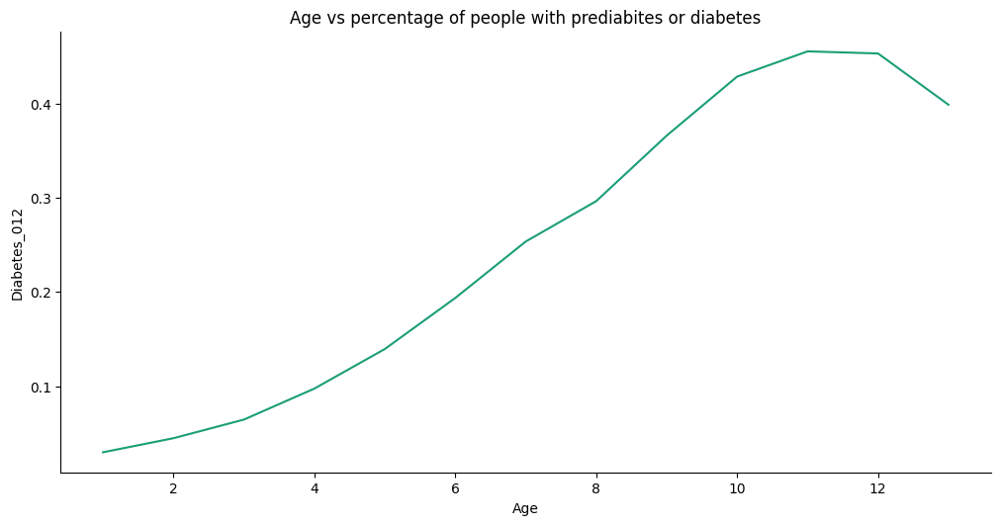

In [ ]:
train_df_01 = train_df.copy()

train_df_01[train_df_01['Diabetes_012']==2] = 1

age_diabetes_percentage = train_df.groupby('Age')['Diabetes_012'].mean().reset_index()
age_diabetes_percentage

# def _plot_series(series, series_name, series_index=0):
#   from matplotlib import pyplot as plt
#   #import seaborn as sns
#   palette = list(sns.palettes.mpl_palette('Dark2'))
#   xs = series['Age']
#   ys = series['Diabetes_012']

#   plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

# fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
# df_sorted = age_diabetes_percentage.sort_values('Age', ascending=True)
# _plot_series(df_sorted, '')
# sns.despine(fig=fig, ax=ax)
# plt.title('Age vs percentage of people with prediabites or diabetes')
# plt.xlabel('Age')
# _ = plt.ylabel('Diabetes_012')

Observations:
* Strong correlation
* The older person is, the bigger percentage of their age has diabetes

### Age column description
1  Age 18 to 24 Respondents with reported age between 18 and 24 years (18 <= AGE <= 24)

2  Age 25 to 29 Respondents with reported age between 25 and 29 years (25 <= AGE <= 29)

3  Age 30 to 34 Respondents with reported age between 30 and 34 years (30 <= AGE <= 34)

4  Age 35 to 39 Respondents with reported age between 35 and 39 years (35 <= AGE <= 39)

5  Age 40 to 44 Respondents with reported age between 40 and 44 years (40 <= AGE <= 44)

6  Age 45 to 49 Respondents with reported age between 45 and 49 years (45 <= AGE <= 49)

7  Age 50 to 54 Respondents with reported age between 50 and 54 years (50 <= AGE <= 54)

8  Age 55 to 59 Respondents with reported age between 55 and 59 years (55 <= AGE <= 59)

9  Age 60 to 64 Respondents with reported age between 60 and 64 years (60 <= AGE <= 64)

10  Age 65 to 69 Respondents with reported age between 65 and 69 years (65 <= AGE <= 69)

11  Age 70 to 74 Respondents with reported age between 70 and 74 years (70 <= AGE <= 74)

12  Age 75 to 79 Respondents with reported age between 75 and 79 years (75 <= AGE <= 79)

13  Age 80 or older Respondents with reported age between 80 and 99 years (80 <= AGE <= 99)

# Age vs. pre- and diabetes - violin plot

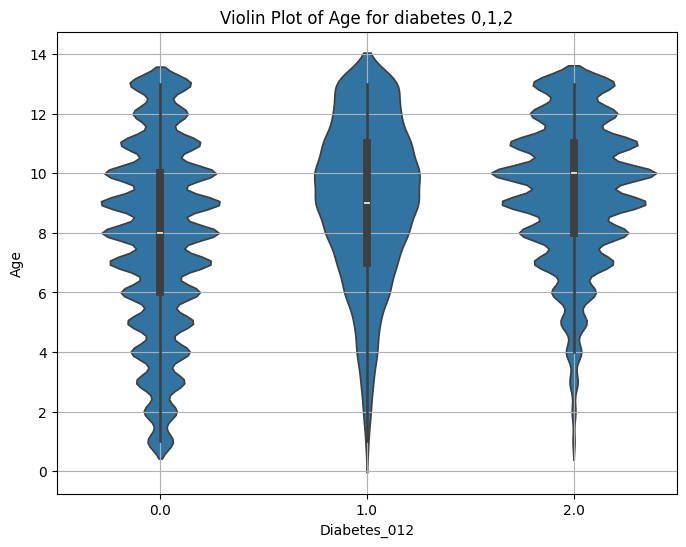

In [ ]:
# Violin plot for people who have and don't have diabetes to check if they were feeling bad during the the last 30 days
plt.figure(figsize=(8, 6))
sns.violinplot(x='Diabetes_012', y='Age', data=train_df)
plt.title('Violin Plot of Age for diabetes 0,1,2')
plt.xlabel('Diabetes_012')
plt.ylabel('Age')
plt.grid(True)

Observations:
* Age of the people without diabetes is of the normal distribution
* Prediabetes is mostly covers older people (8-12) - biggest number of observations
* People with diabetes are the oldest, almost no observations for young people

# Diabetes vs. Income - not finished

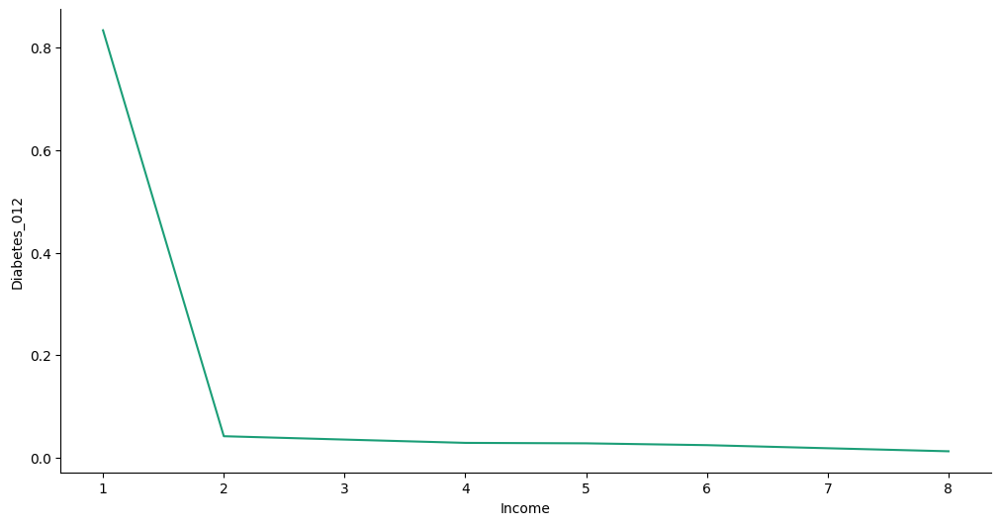

In [ ]:
train_df_01 = train_df.copy()

train_df_01[train_df_01['Diabetes_012']==2]=1

age_diabetes_percentage = train_df_01.groupby('Income')['Diabetes_012'].mean().reset_index()
age_diabetes_percentage

def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  #import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Income']
  ys = series['Diabetes_012']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = age_diabetes_percentage.sort_values('Income', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Income')
_ = plt.ylabel('Diabetes_012')

Observations
* Downward sloping trend
* The bigger income is, the lower percentage of those with diabetes are in the income group, and the less steep is the curve
* People with income level 1 are most likely to have diabetes or prediabetes

In [ ]:
train_df

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_012
2725,1.0,1.0,1.0,37.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,3.0,15.0,0.0,1.0,0.0,8.0,6.0,1.0,0.0
119890,1.0,1.0,1.0,27.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,3.0,0.0,0.0,0.0,0.0,10.0,6.0,8.0,0.0
148149,0.0,0.0,1.0,21.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,5.0,5.0,8.0,0.0
91717,1.0,1.0,1.0,27.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,3.0,0.0,3.0,0.0,1.0,11.0,5.0,8.0,0.0
102495,0.0,0.0,1.0,31.0,1.0,0.0,0.0,1.0,0.0,1.0,...,1.0,2.0,0.0,0.0,0.0,1.0,2.0,5.0,6.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230663,0.0,0.0,1.0,38.0,0.0,0.0,0.0,1.0,1.0,1.0,...,0.0,2.0,1.0,0.0,0.0,1.0,6.0,5.0,7.0,0.0
202400,1.0,0.0,1.0,33.0,1.0,0.0,0.0,1.0,1.0,1.0,...,0.0,4.0,30.0,20.0,0.0,0.0,4.0,5.0,6.0,0.0
176569,0.0,0.0,1.0,24.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,5.0,16.0,12.0,0.0,0.0,2.0,4.0,3.0,0.0
248490,0.0,0.0,1.0,33.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,2.0,0.0,0.0,0.0,1.0,11.0,2.0,8.0,2.0
